# Coronal3 Striatum IF Alignment

Very helpful tutorial, but for Xenium native H&E images (a little outdated)
https://github.com/quentinblampey/spatialdata_xenium_explorer/blob/master/docs/10x_tutorials/xenium/xenium_tuto.ipynb

In [1]:
import spatialdata as sd
import spatialdata.transformations as sdtrans
import spatialdata_plot
import spatialdata_io as sdio
import tifffile as tif
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd
import seaborn as sns
import os

/opt/conda/lib/python3.11/site-packages/cudf/utils/_ptxcompiler.py:64: UserWarning: Error getting driver and runtime versions:

stdout:



stderr:

Traceback (most recent call last):
  File "<string>", line 4, in <module>
  File "/opt/conda/lib/python3.11/site-packages/numba/cuda/cudadrv/driver.py", line 295, in __getattr__
    raise CudaSupportError("Error at driver init: \n%s:" %
numba.cuda.cudadrv.error.CudaSupportError: Error at driver init: 

CUDA driver library cannot be found.
If you are sure that a CUDA driver is installed,
try setting environment variable NUMBA_CUDA_DRIVER
with the file path of the CUDA driver shared library.
:


Not patching Numba
  warnings.warn(msg, UserWarning)
/opt/conda/lib/python3.11/site-packages/cudf/utils/gpu_utils.py:62: UserWarning: Failed to dlopen libcuda.so.1
  warnings.warn(str(e))
<frozen importlib._bootstrap>:241: RuntimeWarning: pyarrow.lib.ChunkedArray size changed, may indicate binary incompatibility. Expected 64 from C header, got 72 from

In [2]:
input_dir = '/tscc/projects/ps-yeolab5/share/CNT/Naga/synapse/data/'  # /mnt/d/synapse/data/
output_dir = 'outputs/'  # /mnt/d/synapse/data/sdata_aligned/

In [3]:
sdata = sd.read_zarr(os.path.join(input_dir, "sdata/coronal3.zarr"))
sdata

/opt/conda/lib/python3.11/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


SpatialData object, with associated Zarr store: /tscc/projects/ps-yeolab5/share/CNT/Naga/synapse/data/sdata/coronal3.zarr
├── Images
│     └── 'morphology_focus': DataTree[cyx] (5, 30759, 39849), (5, 15379, 19924), (5, 7689, 9962), (5, 3844, 4981), (5, 1922, 2490)
├── Labels
│     ├── 'cell_labels': DataTree[yx] (30759, 39849), (15379, 19924), (7689, 9962), (3844, 4981), (1922, 2490)
│     └── 'nucleus_labels': DataTree[yx] (30759, 39849), (15379, 19924), (7689, 9962), (3844, 4981), (1922, 2490)
├── Points
│     └── 'transcripts': DataFrame with shape: (<Delayed>, 13) (3D points)
├── Shapes
│     ├── 'cell_boundaries': GeoDataFrame shape: (137686, 1) (2D shapes)
│     ├── 'cell_circles': GeoDataFrame shape: (137686, 2) (2D shapes)
│     └── 'nucleus_boundaries': GeoDataFrame shape: (136117, 1) (2D shapes)
└── Tables
      └── 'table': AnnData (137686, 5006)
with coordinate systems:
    ▸ 'global', with elements:
        morphology_focus (Images), cell_labels (Labels), nucleus_labels (L

## Align Images

In [4]:
dapi_align = sdio.xenium_aligned_image(
    os.path.join(input_dir, "coronal3_aligned_striatum/2024_11_05/0040870 Section 1_Region 1_Merged_Crop001_ch00.tif"),
    os.path.join(input_dir, "coronal3_aligned_striatum/2024_11_05/matrix.csv"),
    dims=("c", "y", "x"),
)

pre_align = sdio.xenium_aligned_image(
    os.path.join(input_dir, "coronal3_aligned_striatum/2024_11_05/0040870 Section 1_Region 1_Merged_Crop001_ch01.tif"),
    os.path.join(input_dir, "coronal3_aligned_striatum/2024_11_05/matrix.csv"),
    dims=("c", "y", "x"),
)

post_align = sdio.xenium_aligned_image(
    os.path.join(input_dir, "coronal3_aligned_striatum/2024_11_05/0040870 Section 1_Region 1_Merged_Crop001_ch02.tif"),
    os.path.join(input_dir, "coronal3_aligned_striatum/2024_11_05/matrix.csv"),
    dims=("c", "y", "x"),
)

dapi_if = sd.models.Image2DModel.parse(dapi_align)
pre_if = sd.models.Image2DModel.parse(pre_align)
post_if = sd.models.Image2DModel.parse(post_align)

sdata.images["dapi_if"] = dapi_if
sdata.images["pre_if"] = pre_if
sdata.images["post_if"] = post_if

INFO     `dims` is specified redundantly: found also inside `data`.                                                
INFO     `dims` is specified redundantly: found also inside `data`.                                                
INFO     `dims` is specified redundantly: found also inside `data`.                                                


INFO     Rasterizing image for faster rendering.                                                                   
INFO     Rasterizing image for faster rendering.                                                                   


(0.0, 39849.0, 30759.0, 0.0)

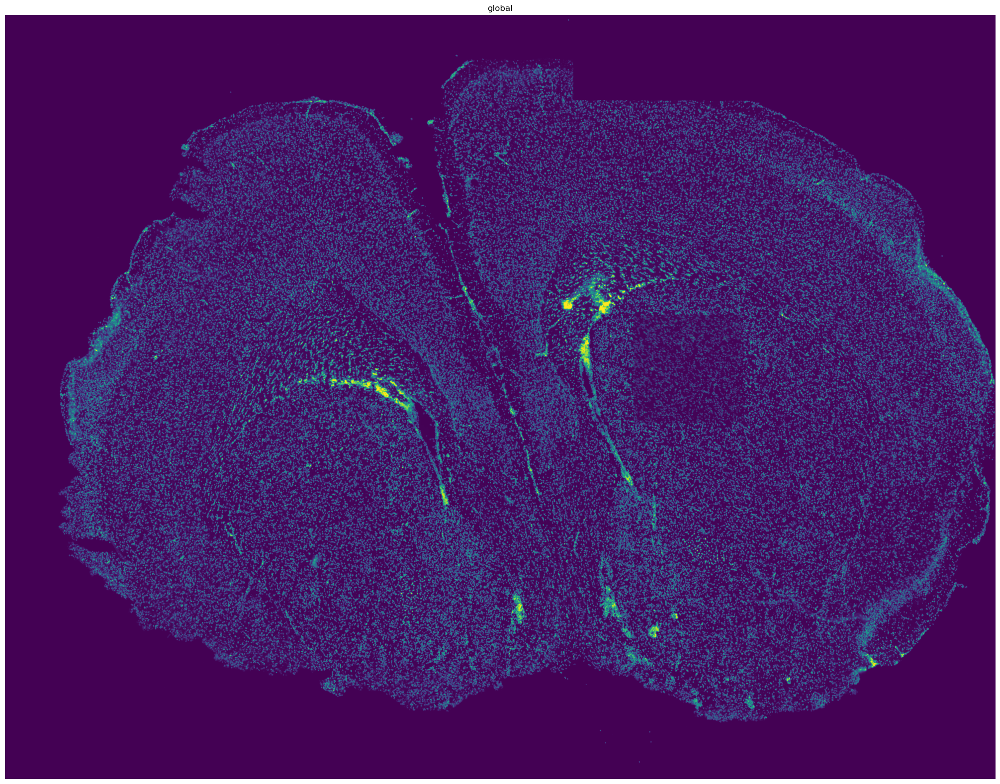

In [5]:
sdata.pl.render_images("morphology_focus", channel="DAPI", scale="3").pl.render_images(
    "dapi_if", alpha=0.5, scale="3"
).pl.show(colorbar=False, figsize=(20, 20))
plt.axis("off")

## Get bounds of ROIs

In [6]:
bbox = sd.get_extent(sdata["dapi_if"])
extent = [[bbox["x"][0], bbox["y"][0]], [bbox["x"][1], bbox["y"][1]]]
sdata_cropped = sd.bounding_box_query(
    sdata,
    axes=("x", "y"),
    min_coordinate=extent[0],
    max_coordinate=extent[1],
    target_coordinate_system="global",
)
sdata_cropped

SpatialData object
├── Images
│     ├── 'dapi_if': DataArray[cyx] (1, 10382, 10296)
│     ├── 'morphology_focus': DataTree[cyx] (5, 4356, 4392), (5, 2178, 2196), (5, 1089, 1098), (5, 544, 549), (5, 273, 275)
│     ├── 'post_if': DataArray[cyx] (1, 10382, 10296)
│     └── 'pre_if': DataArray[cyx] (1, 10382, 10296)
├── Labels
│     ├── 'cell_labels': DataTree[yx] (4356, 4392), (2178, 2196), (1089, 1098), (544, 549), (273, 275)
│     └── 'nucleus_labels': DataTree[yx] (4356, 4392), (2178, 2196), (1089, 1098), (544, 549), (273, 275)
├── Points
│     └── 'transcripts': DataFrame with shape: (<Delayed>, 13) (3D points)
├── Shapes
│     ├── 'cell_boundaries': GeoDataFrame shape: (3166, 1) (2D shapes)
│     ├── 'cell_circles': GeoDataFrame shape: (3090, 2) (2D shapes)
│     └── 'nucleus_boundaries': GeoDataFrame shape: (3143, 1) (2D shapes)
└── Tables
      └── 'table': AnnData (3090, 5006)
with coordinate systems:
    ▸ 'global', with elements:
        dapi_if (Images), morphology_focus (Imag

INFO     Rasterizing image for faster rendering.                                                                   
INFO     Rasterizing image for faster rendering.                                                                   


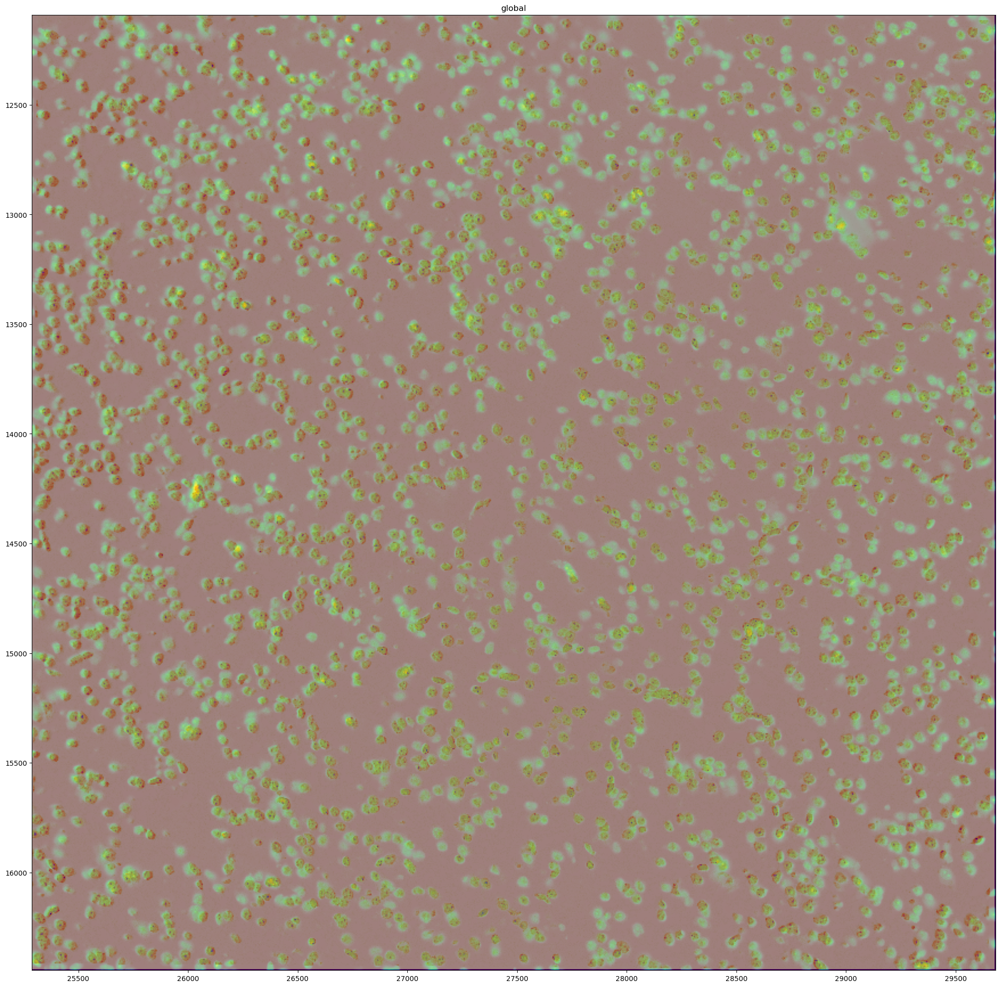

In [7]:
sdata_cropped.pl.render_images(
    "morphology_focus", channel="DAPI", scale="3"
).pl.render_images("dapi_if", alpha=0.5, scale="3", cmap="inferno_r").pl.show(
    colorbar=False, figsize=(20, 20)
)

INFO     Rasterizing image for faster rendering.                                                                   


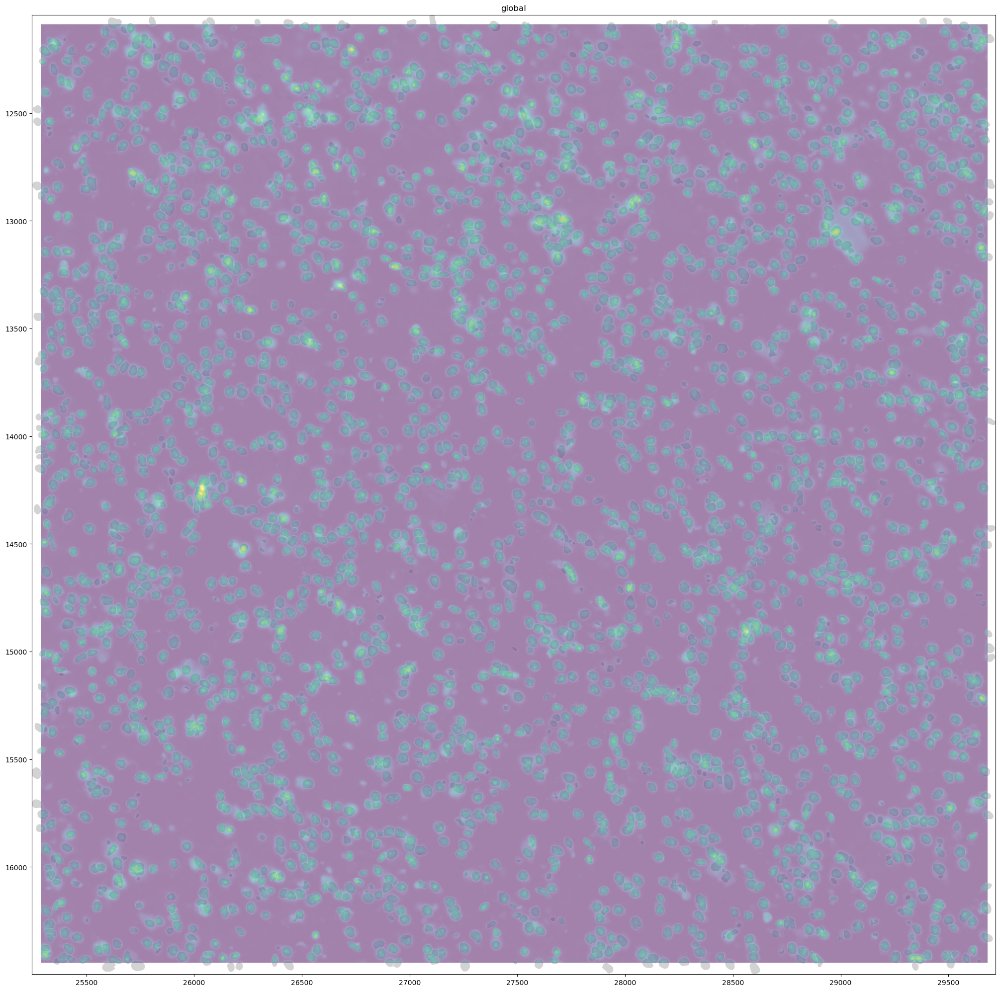

In [8]:
sdata_cropped.pl.render_shapes("nucleus_boundaries").pl.render_images(
    "morphology_focus", channel="DAPI", scale="3", alpha=0.5
).pl.show(colorbar=False, figsize=(20, 20))

INFO     Rasterizing image for faster rendering.                                                                   


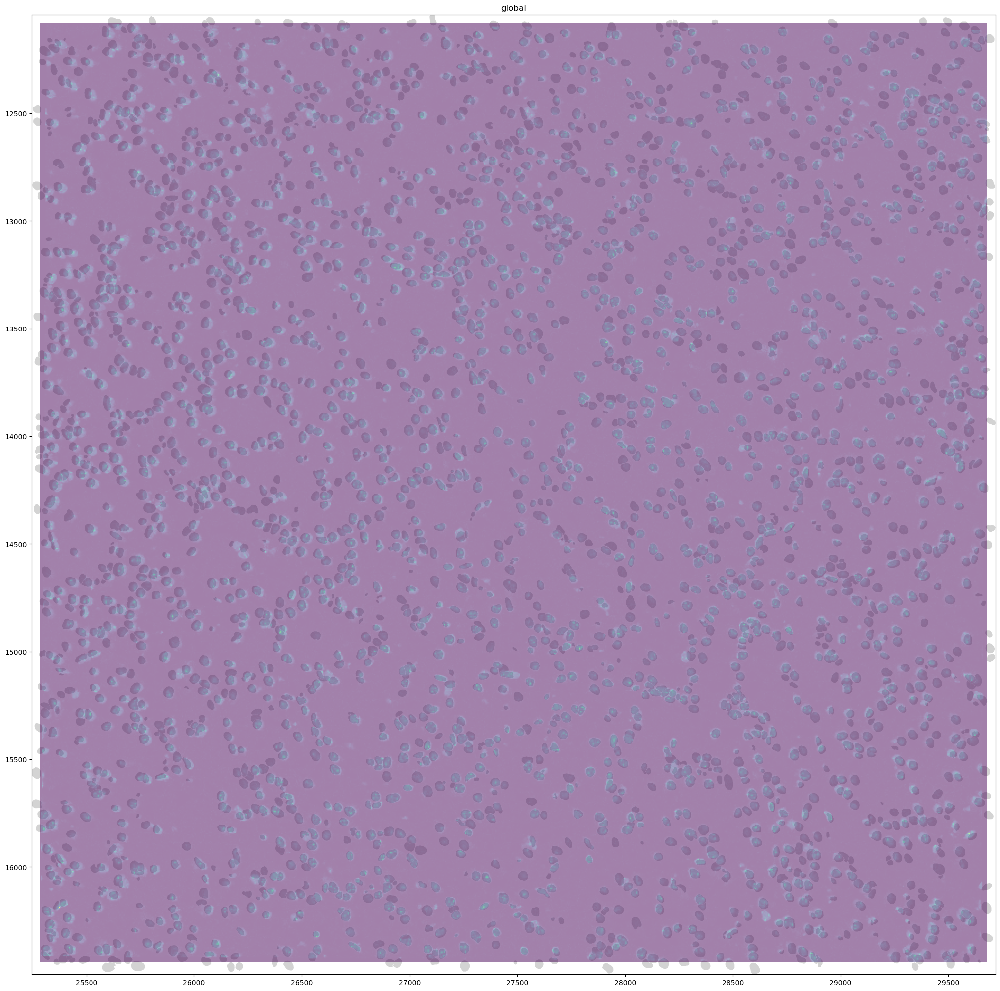

In [9]:
sdata_cropped.pl.render_shapes("nucleus_boundaries").pl.render_images(
    "dapi_if", channel="DAPI", scale="3", alpha=0.5
).pl.show(colorbar=False, figsize=(20, 20))

In [10]:
sdata_cropped.write(os.path.join(output_dir, "coronal3_striatum.zarr"))

INFO     The SpatialData object is not self-contained (i.e. it contains some elements that are Dask-backed from    
         locations outside outputs/coronal3_striatum.zarr). Please see the documentation of `is_self_contained()`  
         to understand the implications of working with SpatialData objects that are not self-contained.           
INFO     The Zarr backing store has been changed from None the new file path: outputs/coronal3_striatum.zarr       
